In [38]:
# Jovian Commit Essentials
# Please retain and execute this cell without modifying the contents for `jovian.commit` to work
!pip install jovian --upgrade -q
import jovian
jovian.set_project('zerotogans-project')
jovian.set_colab_id('1YiGrZ61YVQTPaR-Dqcq9997xhOkPk2cU')

## Dataset Selection

I use `Abstract Art Gallery` from Kaggle for this project.

Datasets Link: [Abstract Art Gallery](https://www.kaggle.com/bryanb/abstract-art-gallery)



## Understand and describe the modeling objective



*   This is a image dataset. This dataset contains 2782 files of abstract images.
*   I want to use Generative modeling in this dataset.



## Download Dataset

In [39]:
!pip install opendatasets --upgrade --quiet

In [40]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/bryanb/abstract-art-gallery'
od.download(dataset_url)

Skipping, found downloaded files in "./abstract-art-gallery" (use force=True to force download)


In [41]:
import os

DATA_DIR = '/content/abstract-art-gallery'
print(os.listdir(DATA_DIR))

['Abstract_gallery']


In [42]:
print(os.listdir(DATA_DIR+'/Abstract_gallery')[:10])

['Abstract_image_1820.jpg', 'Abstract_image_1654.jpg', 'Abstract_image_2109.jpg', 'Abstract_image_2226.jpg', 'Abstract_image_621.jpg', 'Abstract_image_639.jpg', 'Abstract_image_1494.jpg', 'Abstract_image_1642.jpg', 'Abstract_image_2732.jpg', 'Abstract_image_2448.jpg']


In [43]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [44]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [45]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
                                                      T.Resize(image_size),
                                                      T.CenterCrop(image_size),
                                                      T.ToTensor(),
                                                      T.Normalize(*stats)]))
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [46]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [47]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [48]:
def show_images(images,nmax=64):
  fig, ax = plt.subplots(figsize=(8,8))
  ax.set_xticks([]); ax.set_xticks([])
  ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1,2,0))

def show_batch(dl, nmax=64):
  for images, _ in dl:
    show_images(images, nmax)
    break

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


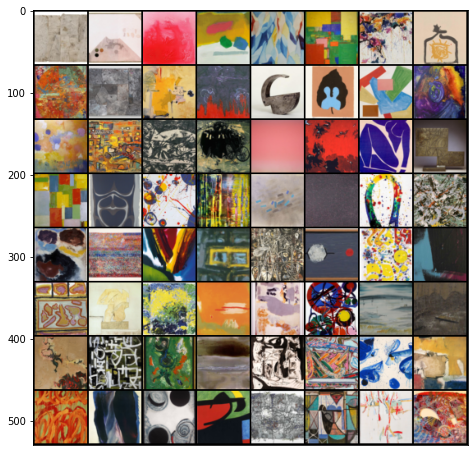

In [49]:
show_batch(train_dl)

In [50]:
project_name = 'zerotogans-project'

In [51]:
!pip install jovian --upgrade --quiet

In [52]:
import jovian

In [53]:
jovian.commit(project="zerotogans-project")

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...


[jovian] Error: Looks like the notebook is missing output cells, please save the notebook and try jovian.commit again.


Committed successfully! https://jovian.ai/anirbansaha/zerotogans-project


'https://jovian.ai/anirbansaha/zerotogans-project'

In [54]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [55]:
device = get_default_device()
device

device(type='cuda')

In [56]:
train_dl = DeviceDataLoader(train_dl, device)

In [57]:
import torch.nn as nn

In [58]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [59]:
discriminator = to_device(discriminator, device)

In [60]:
latent_size = 128

In [61]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


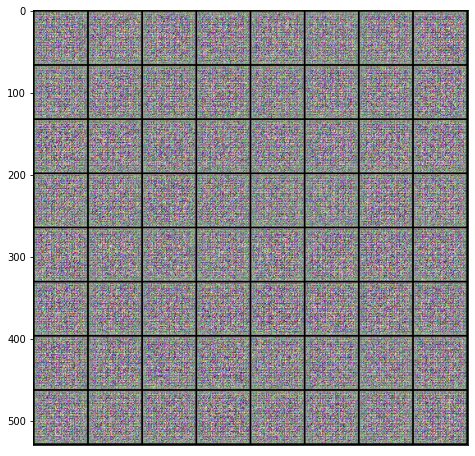

In [62]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [63]:
generator = to_device(generator, device)

In [64]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [65]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [66]:
from torchvision.utils import save_image

In [67]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [68]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [69]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

In [70]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [71]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [72]:
lr = 0.0002
epochs = 100

In [73]:
jovian.reset()
jovian.log_hyperparams(lr=lr, epochs=epochs)

[jovian] Hyperparams logged.


In [74]:
history = fit(epochs, lr)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Epoch [1/100], loss_g: 10.5928, loss_d: 0.2668, real_score: 0.7862, fake_score: 0.0007
Saving generated-images-0001.png



Epoch [2/100], loss_g: 5.2607, loss_d: 0.3817, real_score: 0.7904, fake_score: 0.1183
Saving generated-images-0002.png



Epoch [3/100], loss_g: 5.0281, loss_d: 0.2144, real_score: 0.9538, fake_score: 0.1508
Saving generated-images-0003.png



Epoch [4/100], loss_g: 5.8076, loss_d: 0.6580, real_score: 0.9070, fake_score: 0.4215
Saving generated-images-0004.png



Epoch [5/100], loss_g: 4.5356, loss_d: 0.3618, real_score: 0.7555, fake_score: 0.0555
Saving generated-images-0005.png



Epoch [6/100], loss_g: 4.5507, loss_d: 0.1317, real_score: 0.9337, fake_score: 0.0568
Saving generated-images-0006.png



Epoch [7/100], loss_g: 6.6801, loss_d: 0.2747, real_score: 0.8006, fake_score: 0.0060
Saving generated-images-0007.png



Epoch [8/100], loss_g: 5.4167, loss_d: 0.1244, real_score: 0.9599, fake_score: 0.0775
Saving generated-images-0008.png



Epoch [9/100], loss_g: 3.7723, loss_d: 0.3528, real_score: 0.8733, fake_score: 0.1685
Saving generated-images-0009.png



Epoch [10/100], loss_g: 2.7952, loss_d: 0.6376, real_score: 0.6970, fake_score: 0.1860
Saving generated-images-0010.png



Epoch [11/100], loss_g: 2.4867, loss_d: 0.5590, real_score: 0.7100, fake_score: 0.1723
Saving generated-images-0011.png



Epoch [12/100], loss_g: 2.8806, loss_d: 0.4169, real_score: 0.7545, fake_score: 0.0993
Saving generated-images-0012.png



Epoch [13/100], loss_g: 4.3235, loss_d: 0.4259, real_score: 0.7547, fake_score: 0.0762
Saving generated-images-0013.png



Epoch [14/100], loss_g: 2.2577, loss_d: 0.5072, real_score: 0.6606, fake_score: 0.0432
Saving generated-images-0014.png



Epoch [15/100], loss_g: 5.2789, loss_d: 0.4479, real_score: 0.6747, fake_score: 0.0107
Saving generated-images-0015.png



Epoch [16/100], loss_g: 4.4946, loss_d: 0.7964, real_score: 0.9482, fake_score: 0.4892
Saving generated-images-0016.png



Epoch [17/100], loss_g: 2.5372, loss_d: 0.6863, real_score: 0.6227, fake_score: 0.1298
Saving generated-images-0017.png



Epoch [18/100], loss_g: 3.0124, loss_d: 0.6014, real_score: 0.6327, fake_score: 0.0611
Saving generated-images-0018.png



Epoch [19/100], loss_g: 2.8281, loss_d: 0.5935, real_score: 0.6257, fake_score: 0.0377
Saving generated-images-0019.png



Epoch [20/100], loss_g: 4.6314, loss_d: 0.2433, real_score: 0.9622, fake_score: 0.1773
Saving generated-images-0020.png



Epoch [21/100], loss_g: 3.6573, loss_d: 0.4572, real_score: 0.8075, fake_score: 0.1847
Saving generated-images-0021.png



Epoch [22/100], loss_g: 6.2483, loss_d: 0.6968, real_score: 0.6068, fake_score: 0.0019
Saving generated-images-0022.png



Epoch [23/100], loss_g: 2.3697, loss_d: 0.2698, real_score: 0.8926, fake_score: 0.1264
Saving generated-images-0023.png



Epoch [24/100], loss_g: 2.2716, loss_d: 0.4884, real_score: 0.6881, fake_score: 0.0399
Saving generated-images-0024.png



Epoch [25/100], loss_g: 3.2934, loss_d: 0.4749, real_score: 0.8416, fake_score: 0.2389
Saving generated-images-0025.png



Epoch [26/100], loss_g: 3.3574, loss_d: 0.4602, real_score: 0.7673, fake_score: 0.1299
Saving generated-images-0026.png



Epoch [27/100], loss_g: 2.1883, loss_d: 0.7379, real_score: 0.5578, fake_score: 0.0304
Saving generated-images-0027.png



Epoch [28/100], loss_g: 4.1935, loss_d: 0.5216, real_score: 0.8717, fake_score: 0.2826
Saving generated-images-0028.png



Epoch [29/100], loss_g: 3.3978, loss_d: 0.2833, real_score: 0.8432, fake_score: 0.0861
Saving generated-images-0029.png



Epoch [30/100], loss_g: 5.1678, loss_d: 0.9980, real_score: 0.9051, fake_score: 0.5297
Saving generated-images-0030.png



Epoch [31/100], loss_g: 2.8193, loss_d: 0.5050, real_score: 0.6877, fake_score: 0.0709
Saving generated-images-0031.png



Epoch [32/100], loss_g: 2.4234, loss_d: 0.6554, real_score: 0.6213, fake_score: 0.0462
Saving generated-images-0032.png



Epoch [33/100], loss_g: 4.1683, loss_d: 0.6650, real_score: 0.9070, fake_score: 0.4028
Saving generated-images-0033.png



Epoch [34/100], loss_g: 3.2752, loss_d: 0.4247, real_score: 0.7104, fake_score: 0.0277
Saving generated-images-0034.png



Epoch [35/100], loss_g: 3.0767, loss_d: 0.5283, real_score: 0.7116, fake_score: 0.1241
Saving generated-images-0035.png



Epoch [36/100], loss_g: 9.5426, loss_d: 1.0548, real_score: 0.9762, fake_score: 0.5771
Saving generated-images-0036.png



Epoch [37/100], loss_g: 4.8541, loss_d: 0.4964, real_score: 0.6994, fake_score: 0.0495
Saving generated-images-0037.png



Epoch [38/100], loss_g: 3.7316, loss_d: 0.3475, real_score: 0.9187, fake_score: 0.2186
Saving generated-images-0038.png



Epoch [39/100], loss_g: 5.6638, loss_d: 1.1629, real_score: 0.9584, fake_score: 0.6157
Saving generated-images-0039.png



Epoch [40/100], loss_g: 2.5240, loss_d: 0.4759, real_score: 0.7791, fake_score: 0.1732
Saving generated-images-0040.png



Epoch [41/100], loss_g: 2.5062, loss_d: 0.2408, real_score: 0.8596, fake_score: 0.0727
Saving generated-images-0041.png



Epoch [42/100], loss_g: 7.2773, loss_d: 1.0149, real_score: 0.9013, fake_score: 0.5306
Saving generated-images-0042.png



Epoch [43/100], loss_g: 3.4182, loss_d: 0.3865, real_score: 0.8971, fake_score: 0.2098
Saving generated-images-0043.png



Epoch [44/100], loss_g: 1.9134, loss_d: 0.2077, real_score: 0.8872, fake_score: 0.0661
Saving generated-images-0044.png



Epoch [45/100], loss_g: 5.5549, loss_d: 0.8129, real_score: 0.9256, fake_score: 0.4664
Saving generated-images-0045.png



Epoch [46/100], loss_g: 3.6942, loss_d: 0.5701, real_score: 0.7863, fake_score: 0.2492
Saving generated-images-0046.png



Epoch [47/100], loss_g: 5.4552, loss_d: 0.5761, real_score: 0.9311, fake_score: 0.3454
Saving generated-images-0047.png



Epoch [48/100], loss_g: 3.4096, loss_d: 0.5510, real_score: 0.8148, fake_score: 0.2542
Saving generated-images-0048.png



Epoch [49/100], loss_g: 5.3485, loss_d: 0.7973, real_score: 0.9172, fake_score: 0.4455
Saving generated-images-0049.png



Epoch [50/100], loss_g: 5.2164, loss_d: 0.6813, real_score: 0.9033, fake_score: 0.4005
Saving generated-images-0050.png



Epoch [51/100], loss_g: 1.7243, loss_d: 0.9731, real_score: 0.4556, fake_score: 0.0637
Saving generated-images-0051.png



Epoch [52/100], loss_g: 4.0317, loss_d: 0.3827, real_score: 0.9017, fake_score: 0.2190
Saving generated-images-0052.png



Epoch [53/100], loss_g: 5.5115, loss_d: 0.8267, real_score: 0.8057, fake_score: 0.4076
Saving generated-images-0053.png



Epoch [54/100], loss_g: 6.2849, loss_d: 0.8283, real_score: 0.9179, fake_score: 0.4582
Saving generated-images-0054.png



Epoch [55/100], loss_g: 3.3227, loss_d: 0.4805, real_score: 0.7317, fake_score: 0.1122
Saving generated-images-0055.png



Epoch [56/100], loss_g: 4.0357, loss_d: 0.4059, real_score: 0.7918, fake_score: 0.0862
Saving generated-images-0056.png



Epoch [57/100], loss_g: 2.3154, loss_d: 0.7926, real_score: 0.5561, fake_score: 0.1030
Saving generated-images-0057.png



Epoch [58/100], loss_g: 3.7434, loss_d: 0.4163, real_score: 0.7219, fake_score: 0.0480
Saving generated-images-0058.png



Epoch [59/100], loss_g: 2.6281, loss_d: 0.7721, real_score: 0.5882, fake_score: 0.1175
Saving generated-images-0059.png



Epoch [60/100], loss_g: 4.6344, loss_d: 0.5164, real_score: 0.9369, fake_score: 0.3214
Saving generated-images-0060.png



Epoch [61/100], loss_g: 3.8701, loss_d: 0.4440, real_score: 0.7995, fake_score: 0.1714
Saving generated-images-0061.png



Epoch [62/100], loss_g: 3.8478, loss_d: 0.4345, real_score: 0.8181, fake_score: 0.1753
Saving generated-images-0062.png



Epoch [63/100], loss_g: 3.9343, loss_d: 0.3677, real_score: 0.8706, fake_score: 0.1868
Saving generated-images-0063.png



Epoch [64/100], loss_g: 3.7720, loss_d: 0.7125, real_score: 0.7359, fake_score: 0.2838
Saving generated-images-0064.png



Epoch [65/100], loss_g: 2.0962, loss_d: 1.7010, real_score: 0.2527, fake_score: 0.0129
Saving generated-images-0065.png



Epoch [66/100], loss_g: 5.5258, loss_d: 0.7590, real_score: 0.9016, fake_score: 0.4388
Saving generated-images-0066.png



Epoch [67/100], loss_g: 4.3208, loss_d: 0.4739, real_score: 0.8604, fake_score: 0.2528
Saving generated-images-0067.png



Epoch [68/100], loss_g: 3.3267, loss_d: 0.6034, real_score: 0.6577, fake_score: 0.1057
Saving generated-images-0068.png



Epoch [69/100], loss_g: 3.3492, loss_d: 0.2985, real_score: 0.8689, fake_score: 0.1324
Saving generated-images-0069.png



Epoch [70/100], loss_g: 1.7601, loss_d: 0.4529, real_score: 0.7615, fake_score: 0.1305
Saving generated-images-0070.png



Epoch [71/100], loss_g: 4.3826, loss_d: 0.4832, real_score: 0.8964, fake_score: 0.2813
Saving generated-images-0071.png



Epoch [72/100], loss_g: 3.1770, loss_d: 0.7062, real_score: 0.5574, fake_score: 0.0281
Saving generated-images-0072.png



Epoch [73/100], loss_g: 3.4750, loss_d: 0.5224, real_score: 0.7589, fake_score: 0.1779
Saving generated-images-0073.png



Epoch [74/100], loss_g: 5.4532, loss_d: 0.6191, real_score: 0.9177, fake_score: 0.3808
Saving generated-images-0074.png



Epoch [75/100], loss_g: 3.9634, loss_d: 0.2727, real_score: 0.8309, fake_score: 0.0697
Saving generated-images-0075.png



Epoch [76/100], loss_g: 3.0297, loss_d: 2.7953, real_score: 0.1001, fake_score: 0.0005
Saving generated-images-0076.png



Epoch [77/100], loss_g: 4.7142, loss_d: 0.6284, real_score: 0.9191, fake_score: 0.3791
Saving generated-images-0077.png



Epoch [78/100], loss_g: 4.4945, loss_d: 0.4487, real_score: 0.9495, fake_score: 0.3040
Saving generated-images-0078.png



Epoch [79/100], loss_g: 5.5812, loss_d: 0.5513, real_score: 0.9176, fake_score: 0.3261
Saving generated-images-0079.png



Epoch [80/100], loss_g: 4.3582, loss_d: 0.2771, real_score: 0.9106, fake_score: 0.1538
Saving generated-images-0080.png



Epoch [81/100], loss_g: 6.1721, loss_d: 1.4739, real_score: 0.9880, fake_score: 0.7105
Saving generated-images-0081.png



Epoch [82/100], loss_g: 8.0791, loss_d: 0.8234, real_score: 0.9522, fake_score: 0.4785
Saving generated-images-0082.png



Epoch [83/100], loss_g: 3.4337, loss_d: 0.4874, real_score: 0.7785, fake_score: 0.1839
Saving generated-images-0083.png



Epoch [84/100], loss_g: 3.3394, loss_d: 0.4284, real_score: 0.7845, fake_score: 0.1412
Saving generated-images-0084.png



Epoch [85/100], loss_g: 6.0137, loss_d: 0.4226, real_score: 0.9275, fake_score: 0.2588
Saving generated-images-0085.png



Epoch [86/100], loss_g: 6.6954, loss_d: 0.6898, real_score: 0.9024, fake_score: 0.4015
Saving generated-images-0086.png



Epoch [87/100], loss_g: 4.7529, loss_d: 0.2909, real_score: 0.8754, fake_score: 0.1287
Saving generated-images-0087.png



Epoch [88/100], loss_g: 5.9366, loss_d: 0.3324, real_score: 0.9405, fake_score: 0.2154
Saving generated-images-0088.png



Epoch [89/100], loss_g: 5.1592, loss_d: 0.4252, real_score: 0.9325, fake_score: 0.2807
Saving generated-images-0089.png



Epoch [90/100], loss_g: 4.8968, loss_d: 0.4301, real_score: 0.8638, fake_score: 0.2228
Saving generated-images-0090.png



Epoch [91/100], loss_g: 1.2307, loss_d: 0.4045, real_score: 0.7647, fake_score: 0.0737
Saving generated-images-0091.png



Epoch [92/100], loss_g: 4.2326, loss_d: 0.3145, real_score: 0.7920, fake_score: 0.0459
Saving generated-images-0092.png



Epoch [93/100], loss_g: 4.3037, loss_d: 0.2762, real_score: 0.8774, fake_score: 0.1211
Saving generated-images-0093.png



Epoch [94/100], loss_g: 7.9144, loss_d: 1.2482, real_score: 0.9937, fake_score: 0.6253
Saving generated-images-0094.png



Epoch [95/100], loss_g: 4.3386, loss_d: 0.2327, real_score: 0.9725, fake_score: 0.1709
Saving generated-images-0095.png



Epoch [96/100], loss_g: 2.9846, loss_d: 0.4147, real_score: 0.7255, fake_score: 0.0493
Saving generated-images-0096.png



Epoch [97/100], loss_g: 3.5260, loss_d: 0.3351, real_score: 0.8040, fake_score: 0.0900
Saving generated-images-0097.png



Epoch [98/100], loss_g: 4.6217, loss_d: 0.3143, real_score: 0.9494, fake_score: 0.2188
Saving generated-images-0098.png



Epoch [99/100], loss_g: 3.9145, loss_d: 0.2730, real_score: 0.9855, fake_score: 0.2115
Saving generated-images-0099.png



Epoch [100/100], loss_g: 5.1053, loss_d: 0.3091, real_score: 0.7677, fake_score: 0.0122
Saving generated-images-0100.png


In [75]:
losses_g, losses_d, real_scores, fake_scores = history

In [76]:
jovian.log_metrics(loss_g=losses_g[-1], 
                   loss_d=losses_d[-1], 
                   real_score=real_scores[-1], 
                   fake_score=fake_scores[-1])

[jovian] Metrics logged.


In [77]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [78]:
from IPython.display import Image

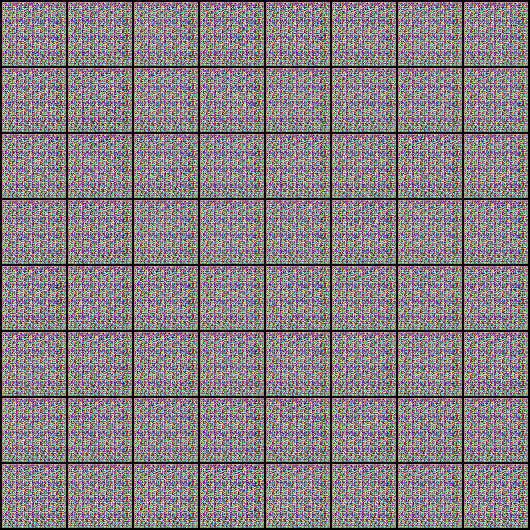

In [79]:
Image('./generated/generated-images-0001.png')

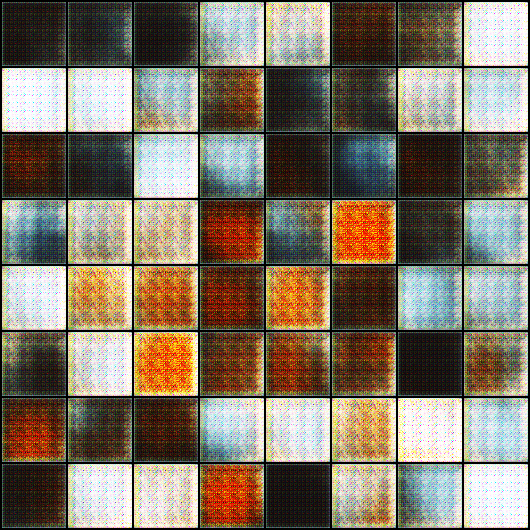

In [80]:
Image('./generated/generated-images-0010.png')

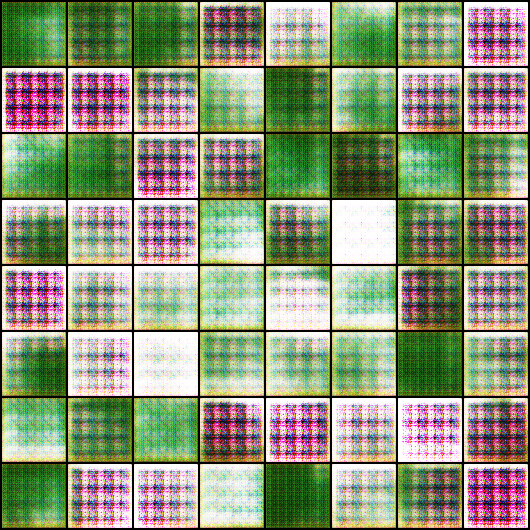

In [81]:
Image('./generated/generated-images-0015.png')

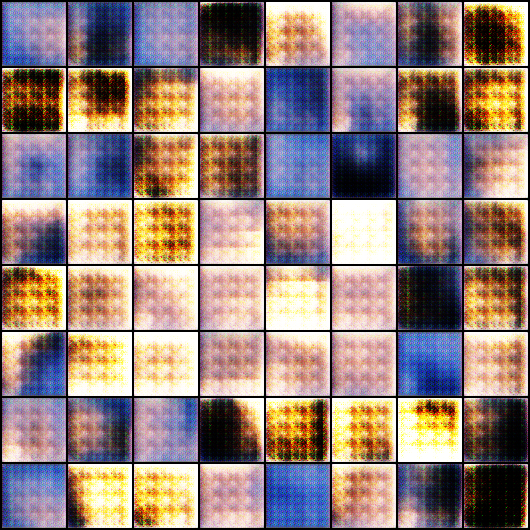

In [82]:
Image('./generated/generated-images-0020.png')

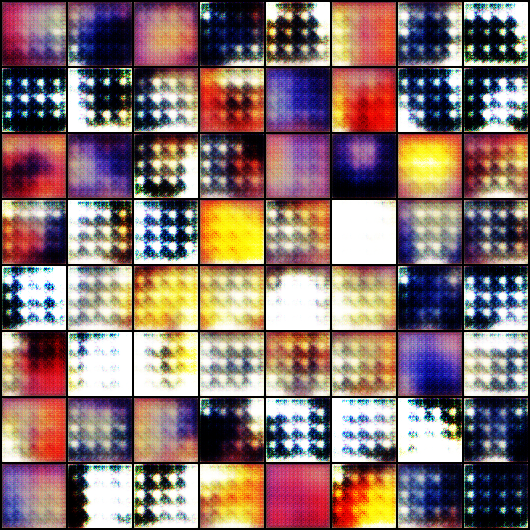

In [83]:
Image('./generated/generated-images-0025.png')

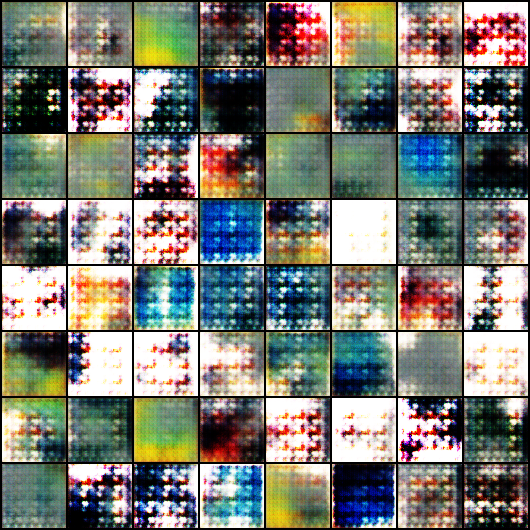

In [84]:
Image('./generated/generated-images-0040.png')

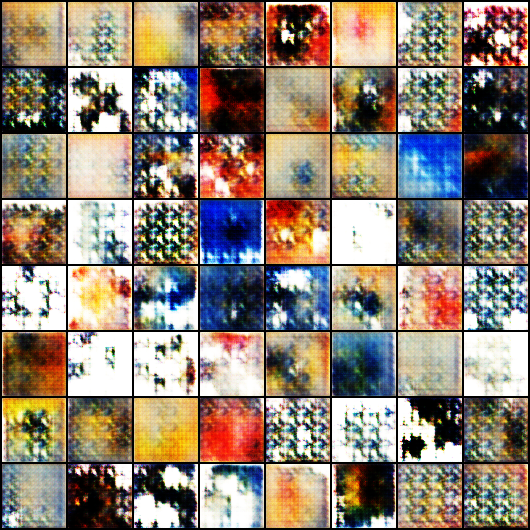

In [85]:
Image('./generated/generated-images-0050.png')

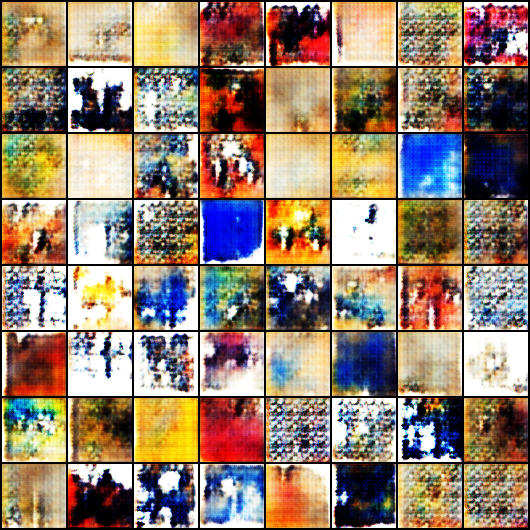

In [86]:
Image('./generated/generated-images-0065.png')

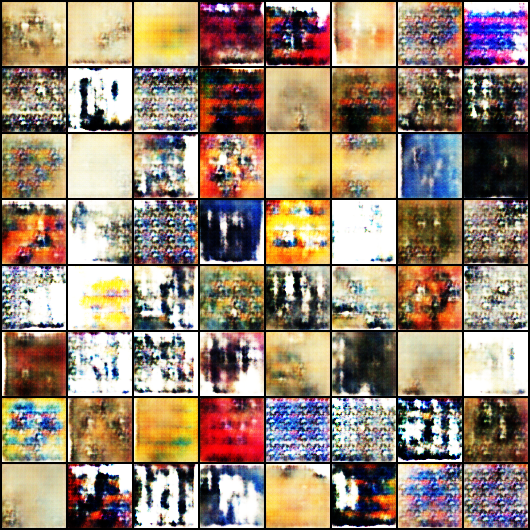

In [87]:
Image('./generated/generated-images-0080.png')

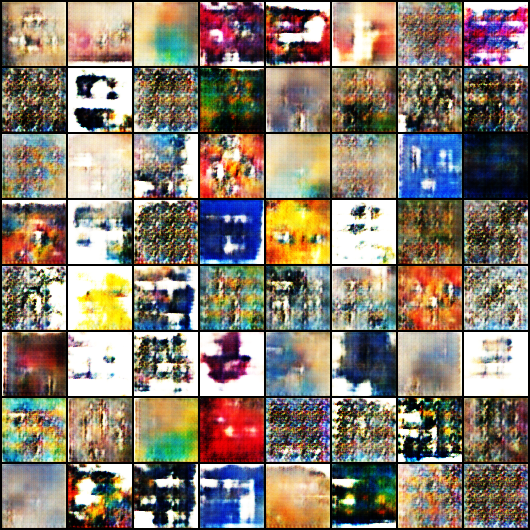

In [88]:
Image('./generated/generated-images-0090.png')

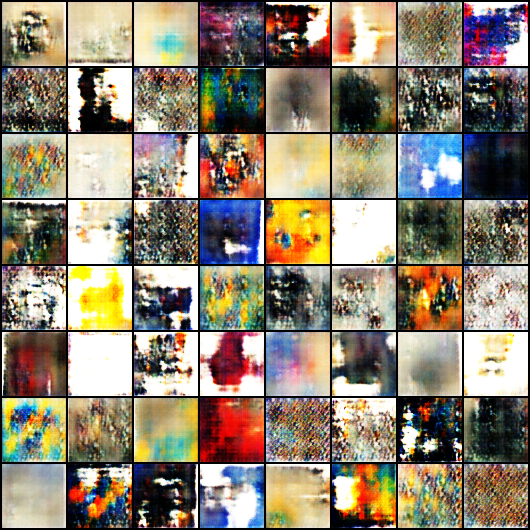

In [89]:
Image('./generated/generated-images-0100.png')

In [90]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

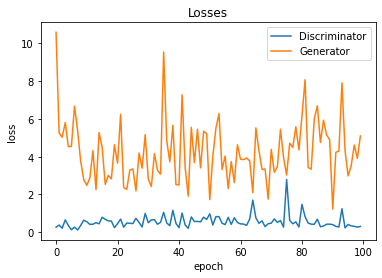

In [91]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

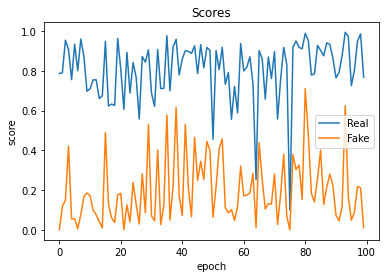

In [92]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

In [93]:
import jovian

In [94]:
jovian.commit(project=project_name, 
              outputs=['G.pth', 'D.pth', 'gans_training.avi'], 
              environment=None)

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...


[jovian] Error: Looks like the notebook is missing output cells, please save the notebook and try jovian.commit again.


[jovian] Uploading additional outputs...
[jovian] Attaching records (metrics, hyperparameters, dataset etc.)
Committed successfully! https://jovian.ai/anirbansaha/zerotogans-project


'https://jovian.ai/anirbansaha/zerotogans-project'

In [95]:
jovian.submit(assignment="zerotogans-project")

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...


[jovian] Error: Looks like the notebook is missing output cells, please save the notebook and try jovian.commit again.


[jovian] Attaching records (metrics, hyperparameters, dataset etc.)
Committed successfully! https://jovian.ai/anirbansaha/zerotogans-project
[jovian] Submitting assignment..
[jovian] Verify your submission at https://jovian.ai/learn/deep-learning-with-pytorch-zero-to-gans/assignment/course-project
